In [1]:
import os
import sys

import matplotlib.colors as colors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns

In [2]:
import celloracle as co
from celloracle.applications import Pseudotime_calculator
from celloracle.applications import Gradient_calculator
from celloracle.applications import Oracle_development_module
co.__version__

'0.18.0'

In [3]:
#plt.rcParams["font.family"] = "arial"
plt.rcParams["figure.figsize"] = [6,6]
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 600

%matplotlib inline

In [4]:
# Make folder to save plots
save_folder = "figures"
os.makedirs(save_folder, exist_ok=True)

In [5]:
oracle = co.load_hdf5("/home/rakesh/Downloads/PBMC.celloracle.oracle")

In [6]:
oracle

Oracle object

Meta data
    celloracle version used for instantiation: 0.18.0
    n_cells: 1108
    n_genes: 25286
    cluster_name: leiden
    dimensional_reduction_name: X_umap
    n_target_genes_in_TFdict: 27150 genes
    n_regulatory_in_TFdict: 1094 genes
    n_regulatory_in_both_TFdict_and_scRNA-seq: 618 genes
    n_target_genes_both_TFdict_and_scRNA-seq: 17199 genes
    k_for_knn_imputation: 27
Status
    Gene expression matrix: Ready
    BaseGRN: Ready
    PCA calculation: Done
    Knn imputation: Done
    GRN calculation for simulation: Not finished

In [7]:
# Instantiate pseudotime object using oracle object.
pt = Pseudotime_calculator(oracle_object=oracle)

In [8]:
print("Clustering name: ", pt.cluster_column_name)
print("Cluster list", pt.cluster_list)

Clustering name:  leiden
Cluster list ['B', 'CD14+ Monocytes', 'CD4 T', 'CD8 T', 'Dendritic', 'FCGR3A+ Monocytes', 'Megakaryocytes', 'NK']


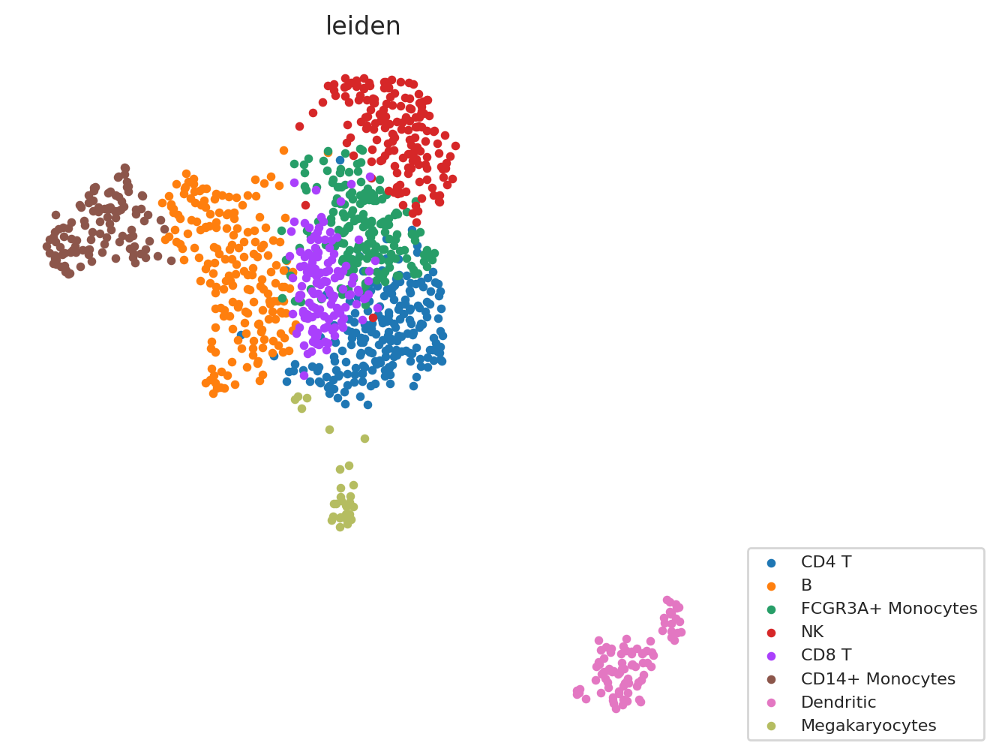

In [9]:
# Check data
pt.plot_cluster(fontsize=8)

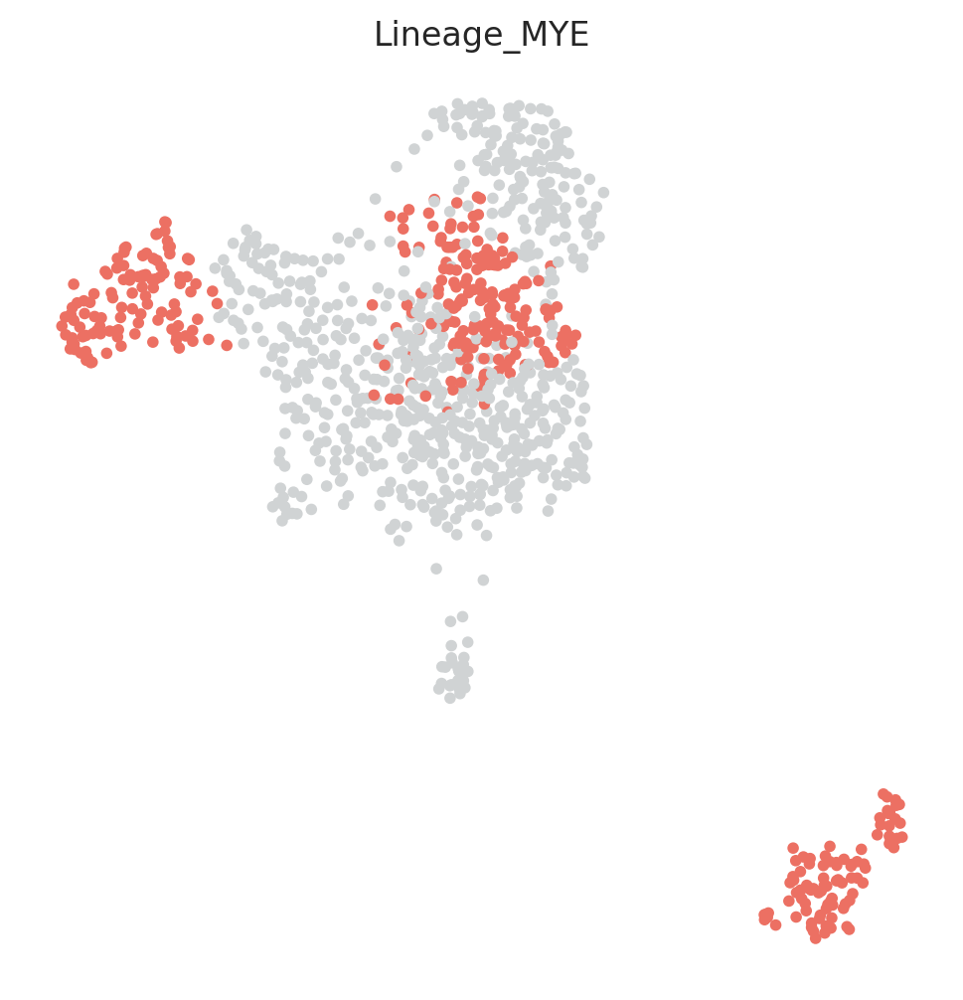

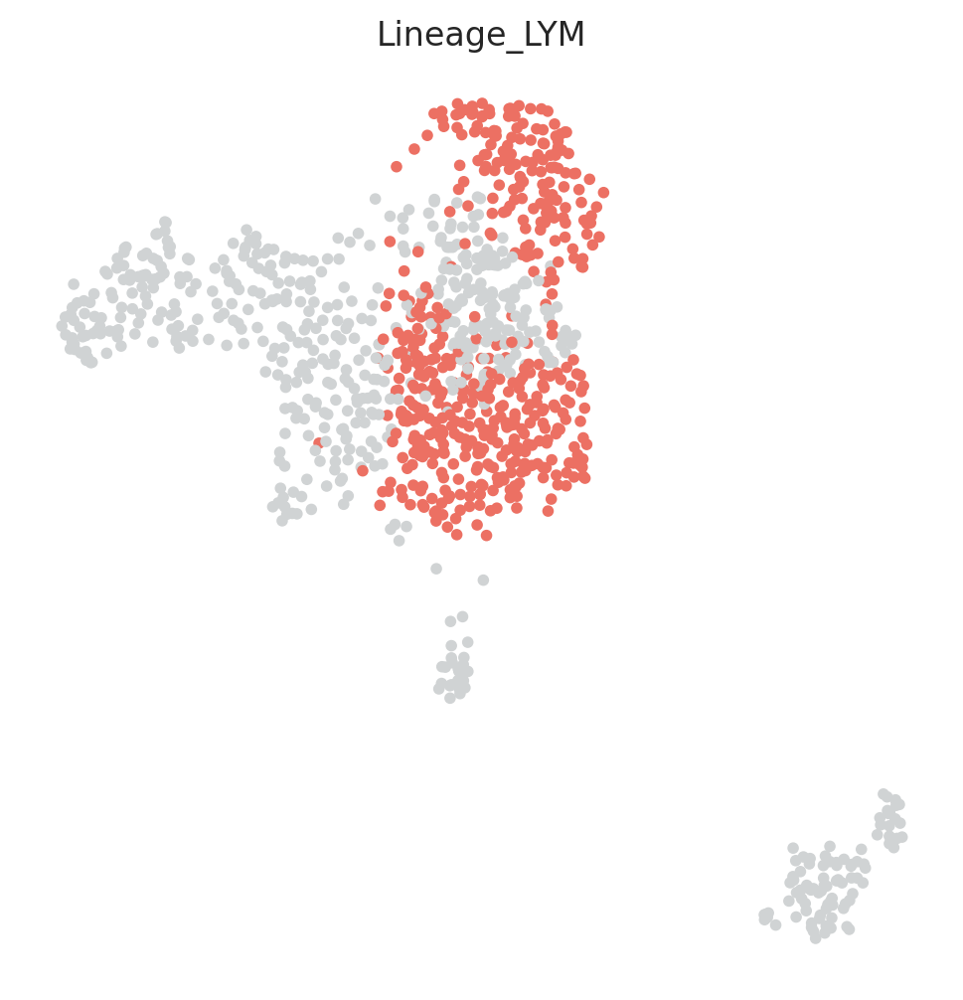

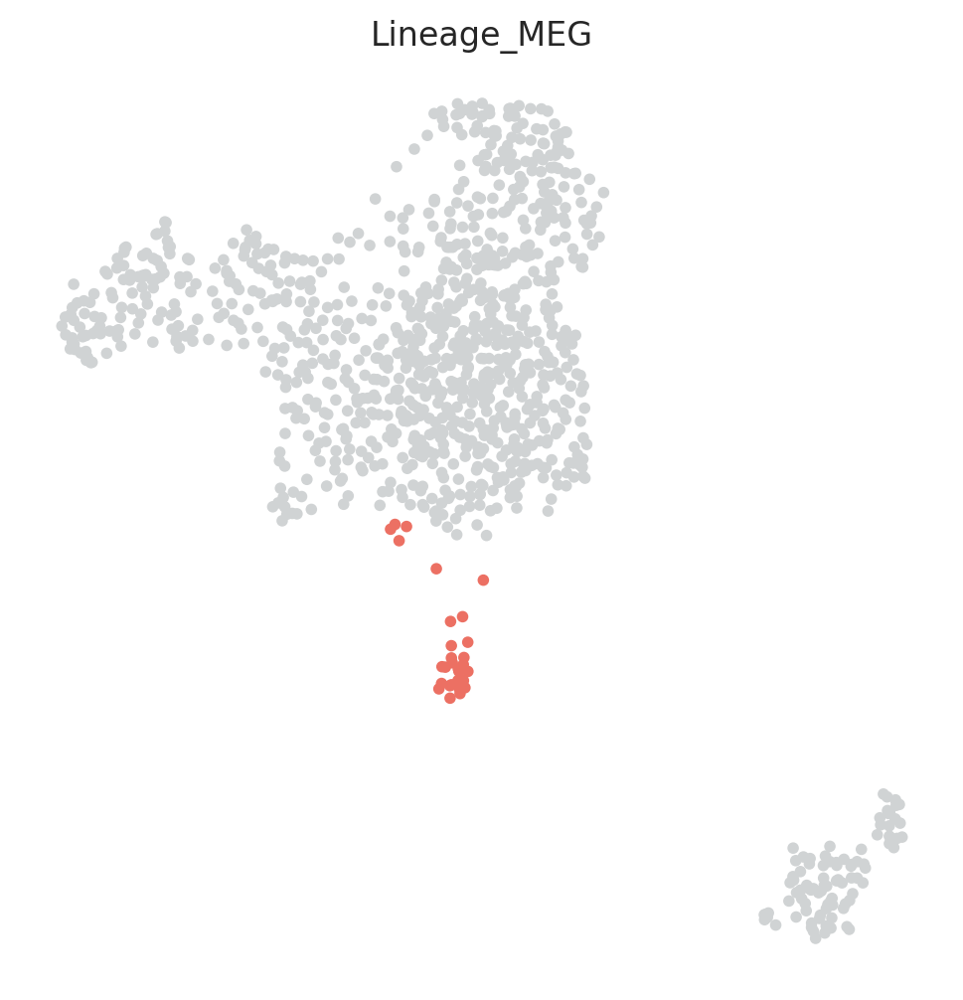

In [10]:
# Here, clusters can be classified into either Myeloid lineage or Lymphoid lineage or Megakaryocyte lineage

clusters_in_MYE_lineage = ['CD14+ Monocytes', 'FCGR3A+ Monocytes', 'Dendritic']
clusters_in_LYM_lineage = ['CD4 T','CD8 T', 'NK']
clusters_in_MEG_lineage = ['Megakaryocytes']

# Make a dictionary
lineage_dictionary = {"Lineage_MYE": clusters_in_MYE_lineage,
           "Lineage_LYM": clusters_in_LYM_lineage, "Lineage_MEG": clusters_in_MEG_lineage}

# Input lineage information into pseudotime object
pt.set_lineage(lineage_dictionary=lineage_dictionary)

# Visualize lineage information
pt.plot_lineages()

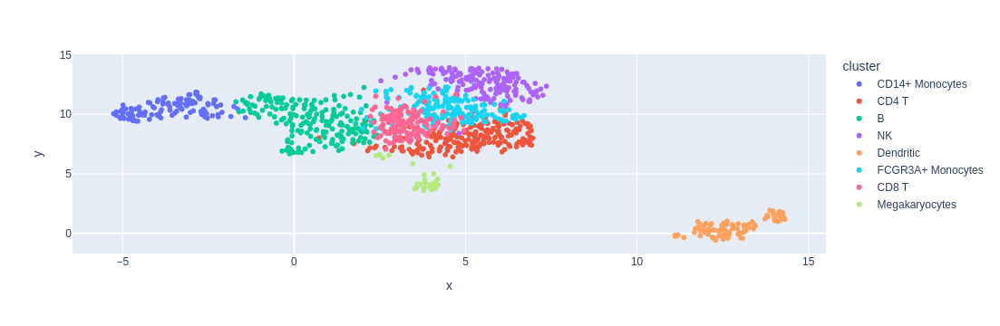

In [11]:
# Show interactive plot using plotly. Please make sure that plotly is installed.

try:
    import plotly.express as px
    def plot(adata, embedding_key, cluster_column_name):
        embedding = adata.obsm[embedding_key]
        df = pd.DataFrame(embedding, columns=["x", "y"])
        df["cluster"] = adata.obs[cluster_column_name].values
        df["label"] = adata.obs.index.values
        fig = px.scatter(df, x="x", y="y", hover_name=df["label"], color="cluster")
        fig.show()

    plot(adata=pt.adata,
         embedding_key=pt.obsm_key,
         cluster_column_name=pt.cluster_column_name)
except:
    print("Plotly not found in your environment. Did you install plotly? Please read the instruction above.")

In [13]:
# Estimated root cell name for each lineage
root_cells = {"Lineage_MYE": "TAGGTTGCAAGGCAAC-1", "Lineage_LYM": "AATCGACTCGCCTCTA-1","Lineage_MEG":"GCTGGGTAGGGAGTGG-1"}
pt.set_root_cells(root_cells=root_cells)

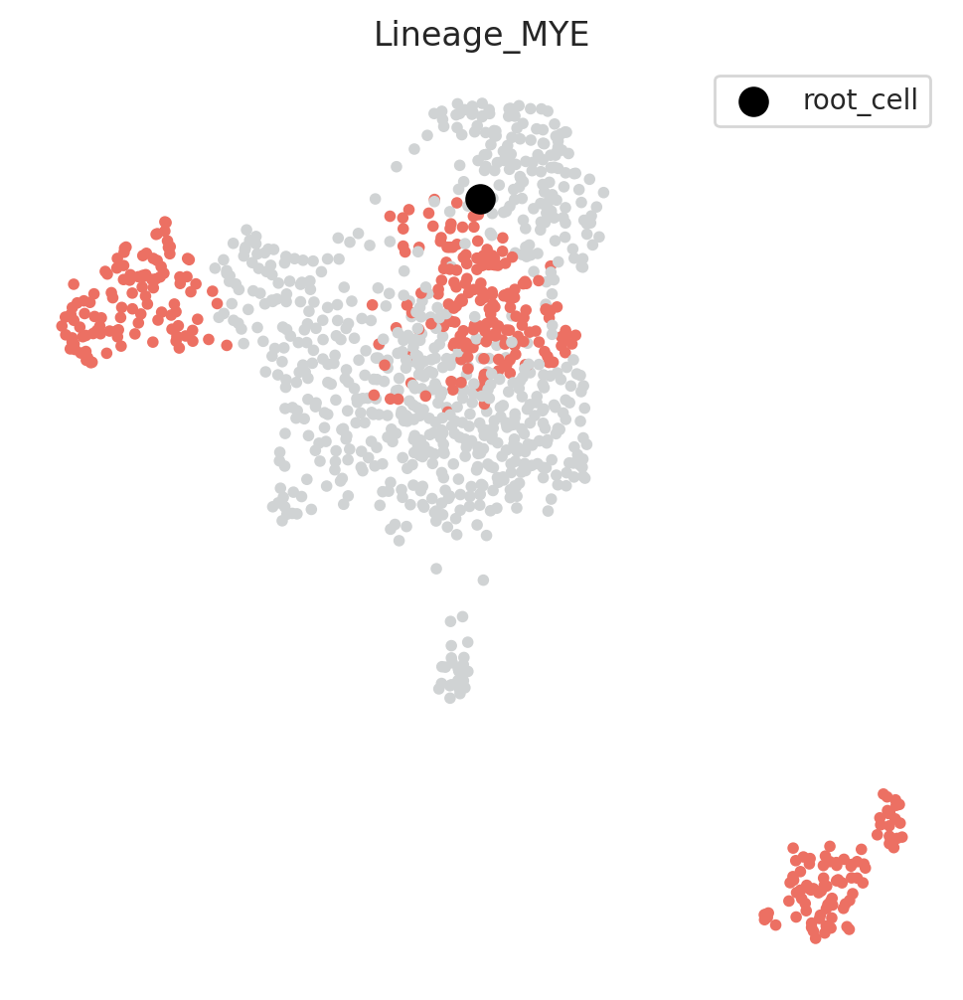

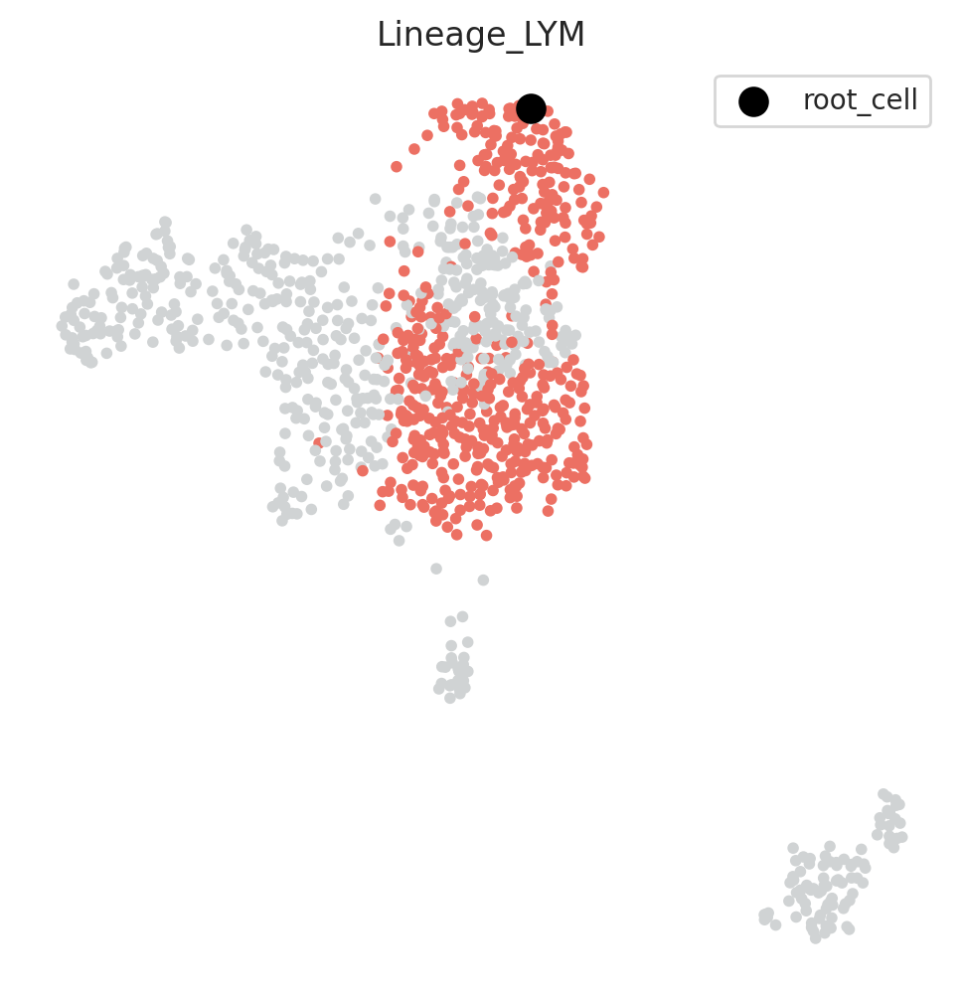

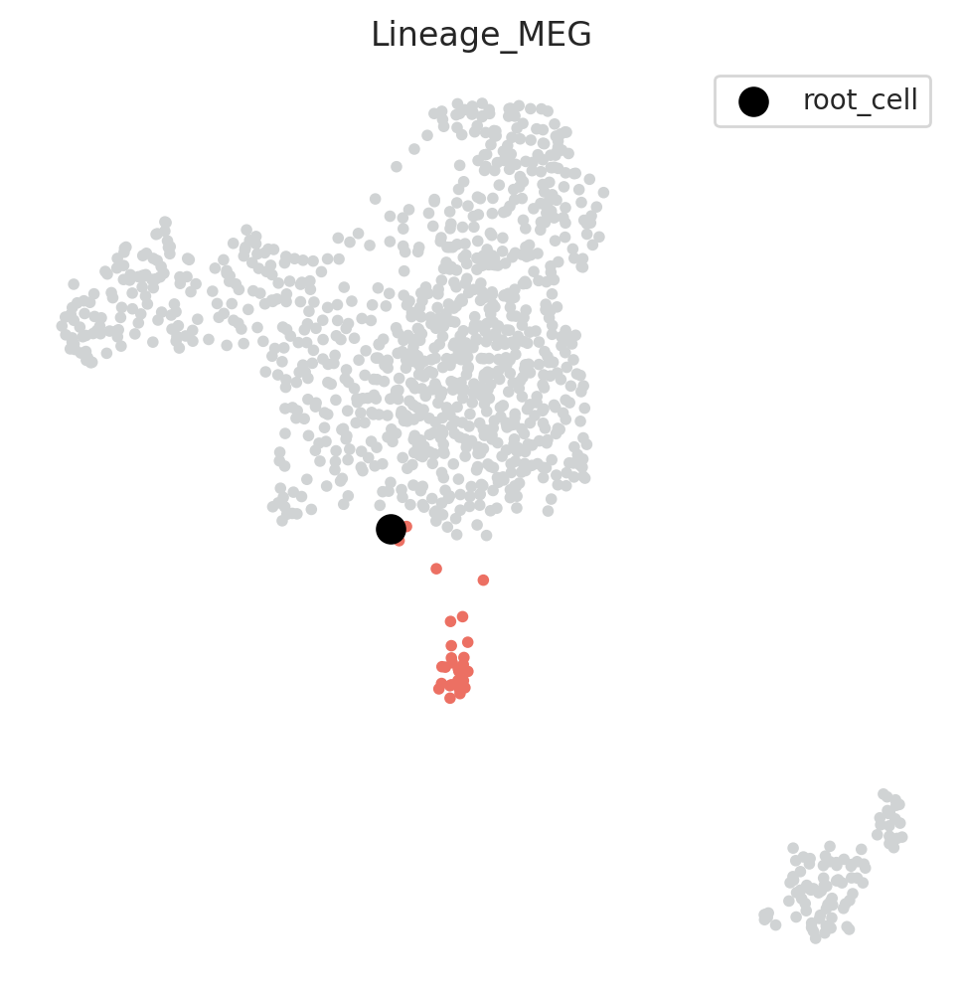

In [14]:
# Check root cell and lineage
pt.plot_root_cells()

In [15]:
# Check diffusion map data.
"X_diffmap" in pt.adata.obsm

False

In [16]:
# calculate diffusion map
sc.pp.neighbors(pt.adata, n_neighbors=30)
sc.tl.diffmap(pt.adata) 

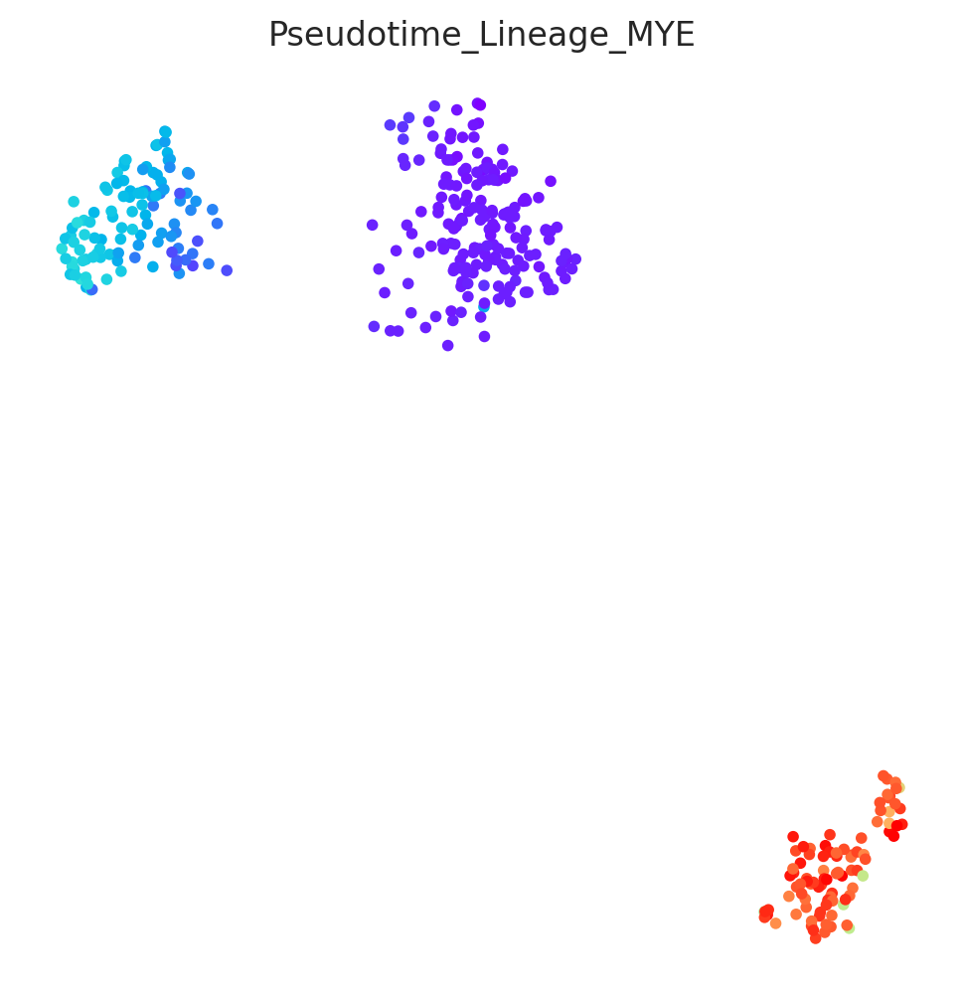

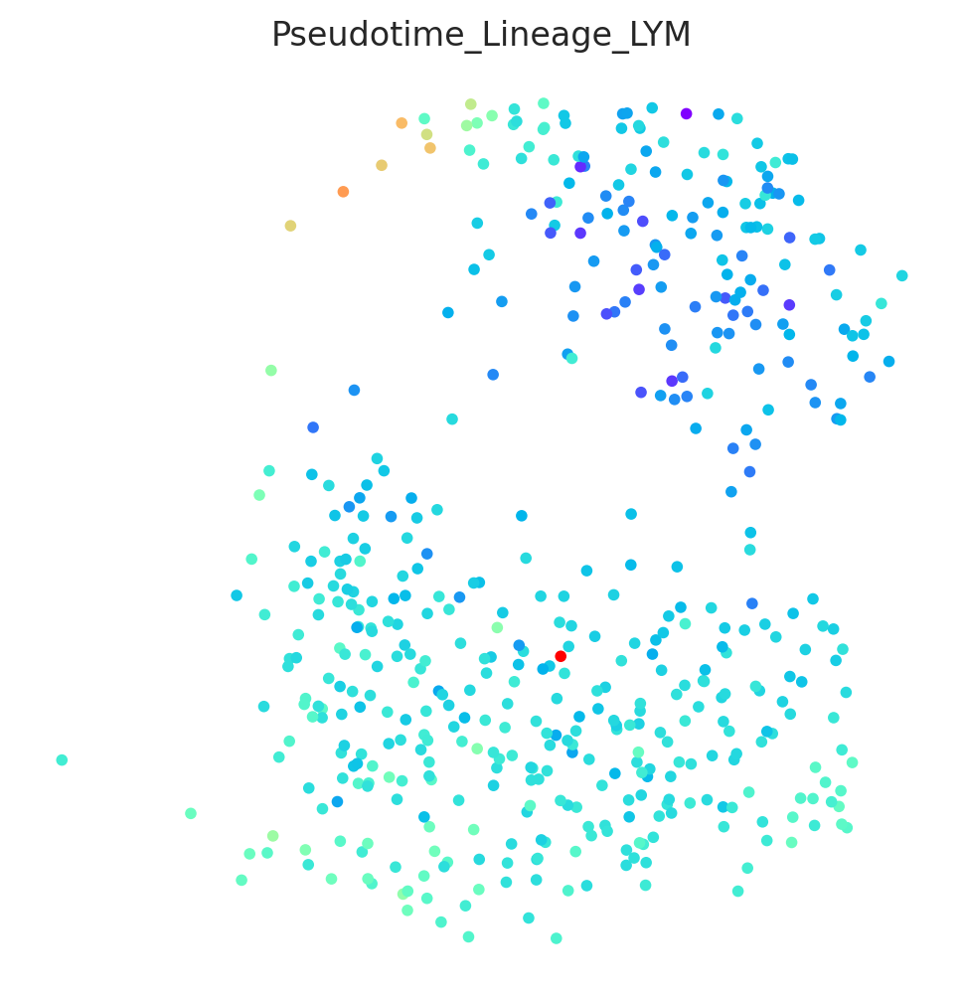

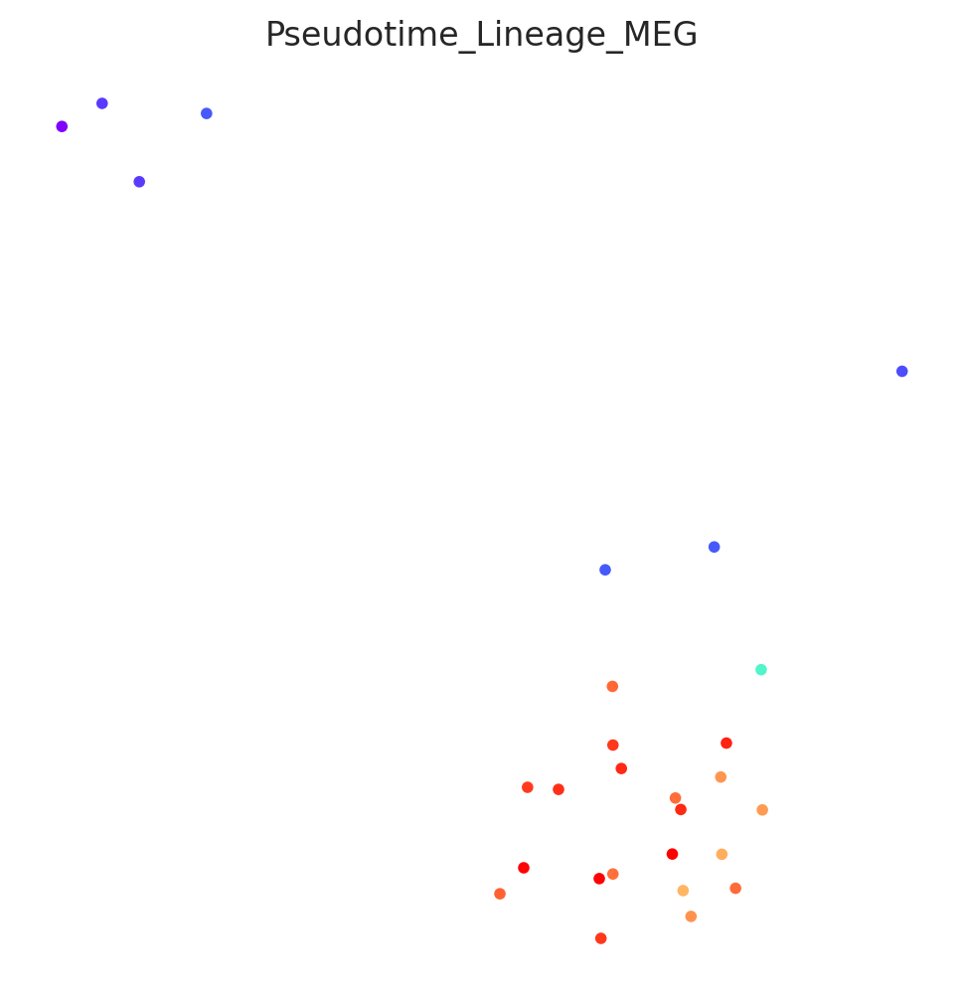

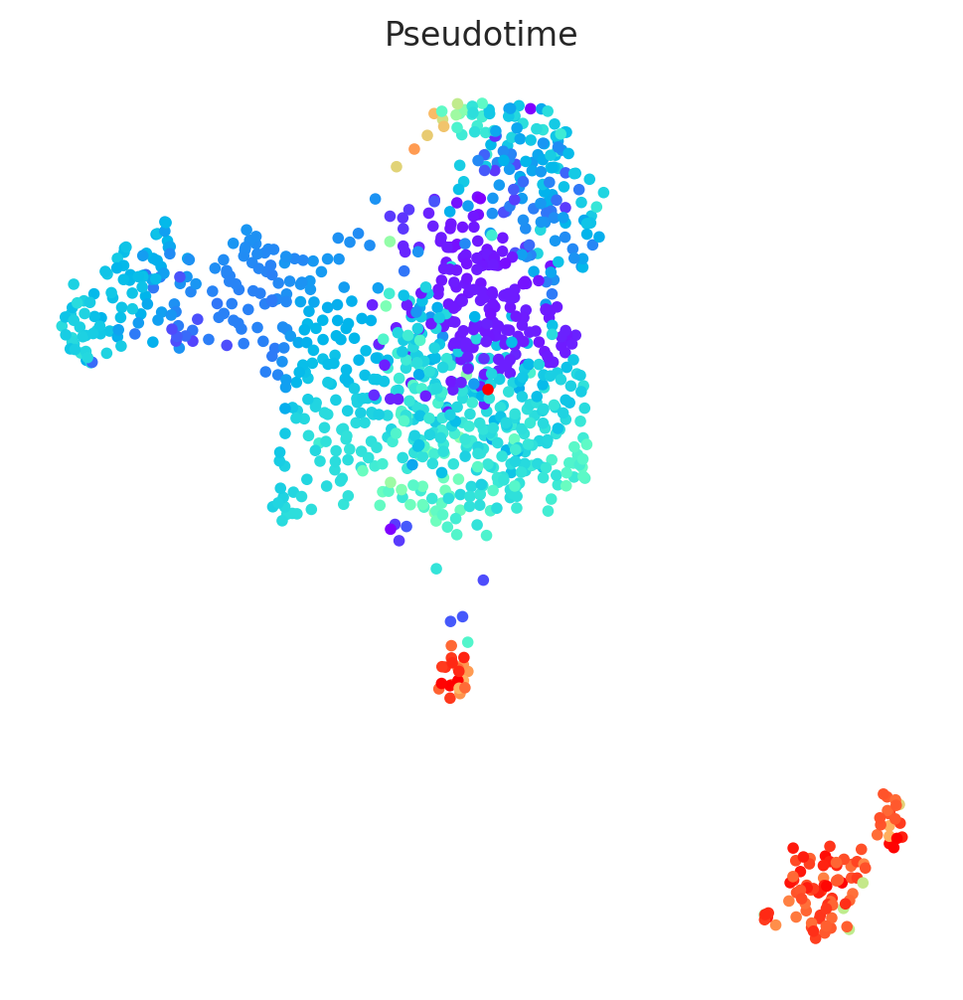

In [17]:
# Calculate pseudotime
pt.get_pseudotime_per_each_lineage()

# Check results
pt.plot_pseudotime(cmap="rainbow")

In [18]:
# Check result
pt.adata.obs[["Pseudotime"]].head()

,Pseudotime
AAACGAATCGACGAGA-1,0.307699
AAAGAACAGCAGCGAT-1,0.298589
AAAGGATAGGAACGAA-1,0.423042
AAAGGGCAGCTATCCA-1,0.332759
AAAGGGCCAAAGAACT-1,0.736448


In [19]:
# Add calculated pseudotime data to the oracle object
oracle.adata.obs = pt.adata.obs

In [20]:
links = co.load_hdf5("/home/rakesh/Downloads/PBMCElinks.celloracle.links")

In [21]:
links.filter_links()
oracle.get_cluster_specific_TFdict_from_Links(links_object=links)
oracle.fit_GRN_for_simulation(alpha=10,
                              use_cluster_specific_TFdict=True)

  0%|          | 0/8 [00:00<?, ?it/s]

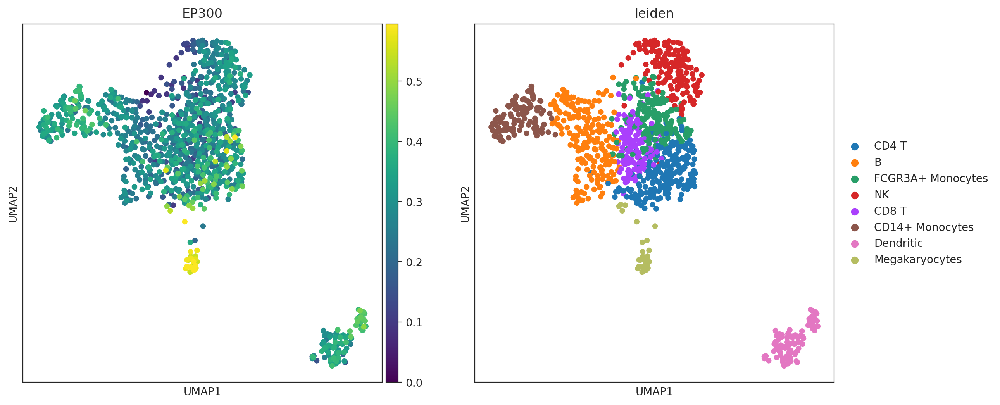

In [22]:
# Check gene expression
goi = "EP300"
sc.pl.umap(oracle.adata, color=[goi, oracle.cluster_column_name],
                 layer="imputed_count", use_raw=False, cmap="viridis")

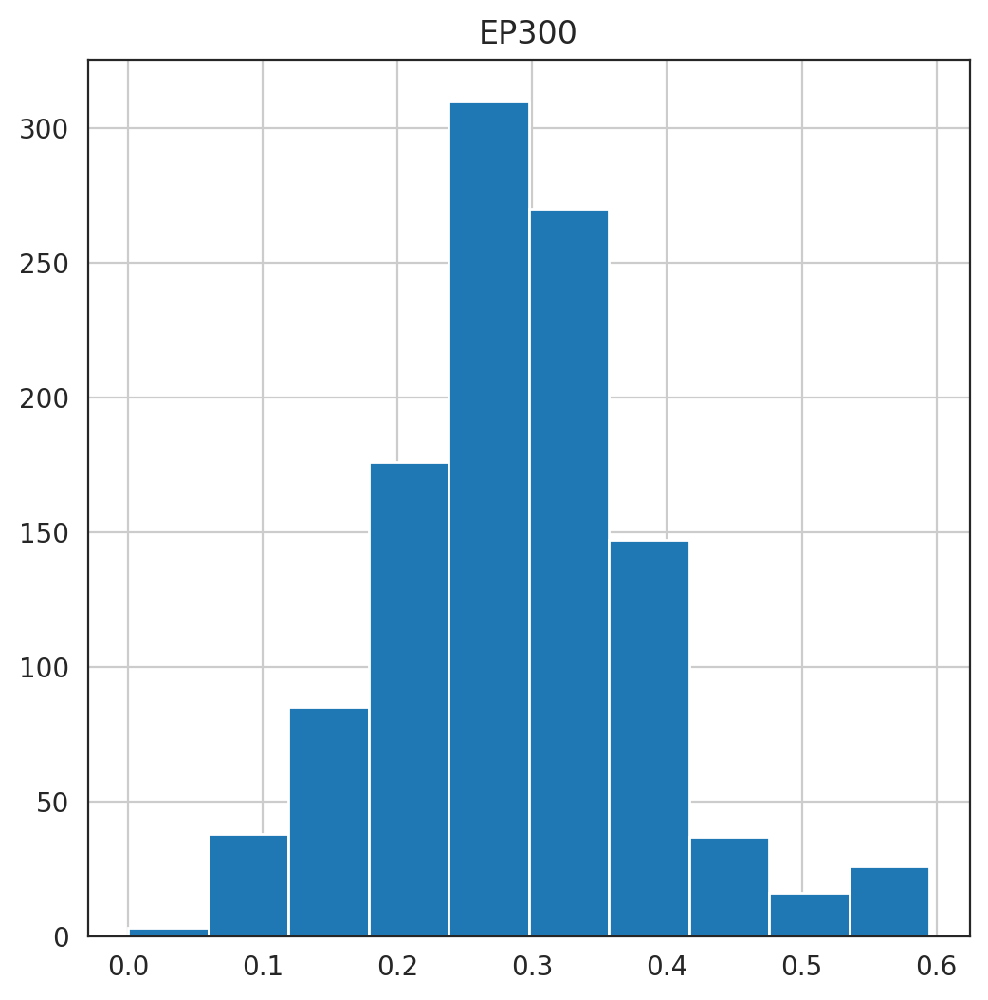

In [23]:
# Plot gene expression in histogram
sc.get.obs_df(oracle.adata, keys=[goi], layer="imputed_count").hist()
plt.show()

In [24]:
# Enter perturbation conditions to simulate signal propagation after the perturbation.
oracle.simulate_shift(perturb_condition={goi: 0.0},
                      n_propagation=3)

In [25]:
# Get transition probability
oracle.estimate_transition_prob(n_neighbors=200,
                                knn_random=True,
                                sampled_fraction=1)

# Calculate embedding
oracle.calculate_embedding_shift(sigma_corr=0.05)

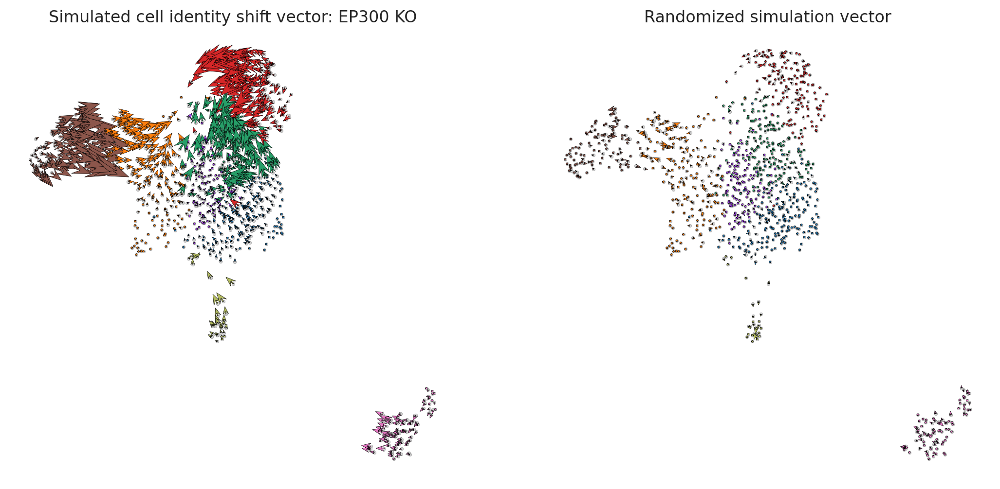

In [26]:
fig, ax = plt.subplots(1, 2,  figsize=[13, 6])

scale = 10
# Show quiver plot
oracle.plot_quiver(scale=scale, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {goi} KO")

# Show quiver plot that was calculated with randomized graph.
oracle.plot_quiver_random(scale=scale, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")

plt.show()

In [27]:
# n_grid = 40 is a good starting value.
n_grid = 40
oracle.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)

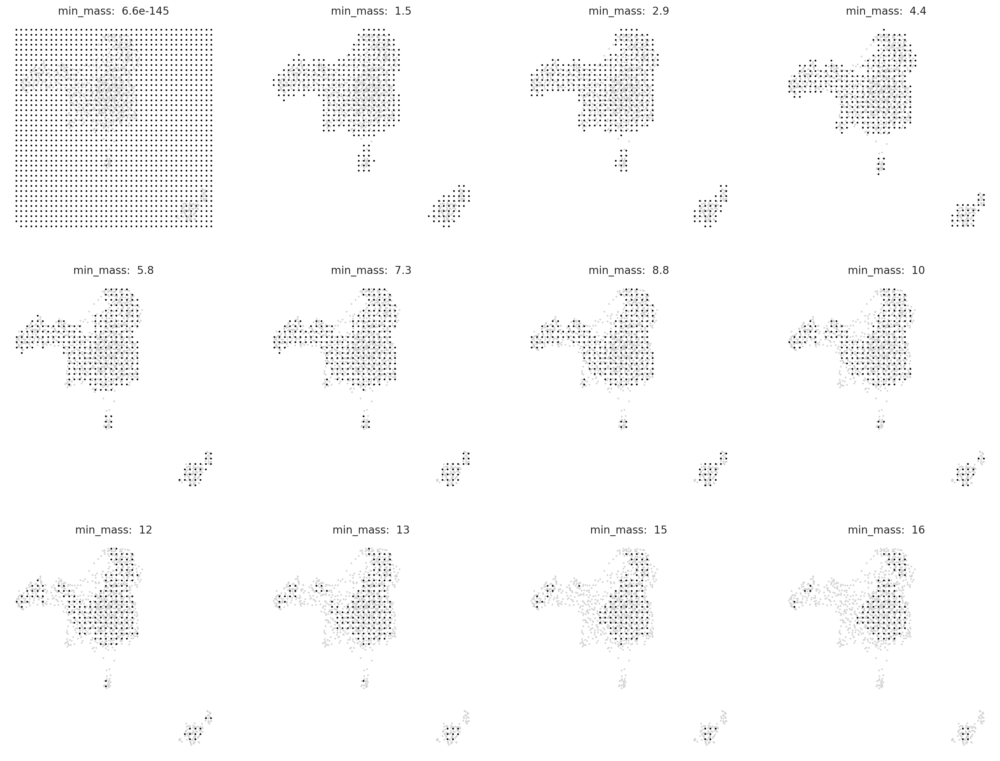

In [28]:
# Search for best min_mass.
oracle.suggest_mass_thresholds(n_suggestion=12)

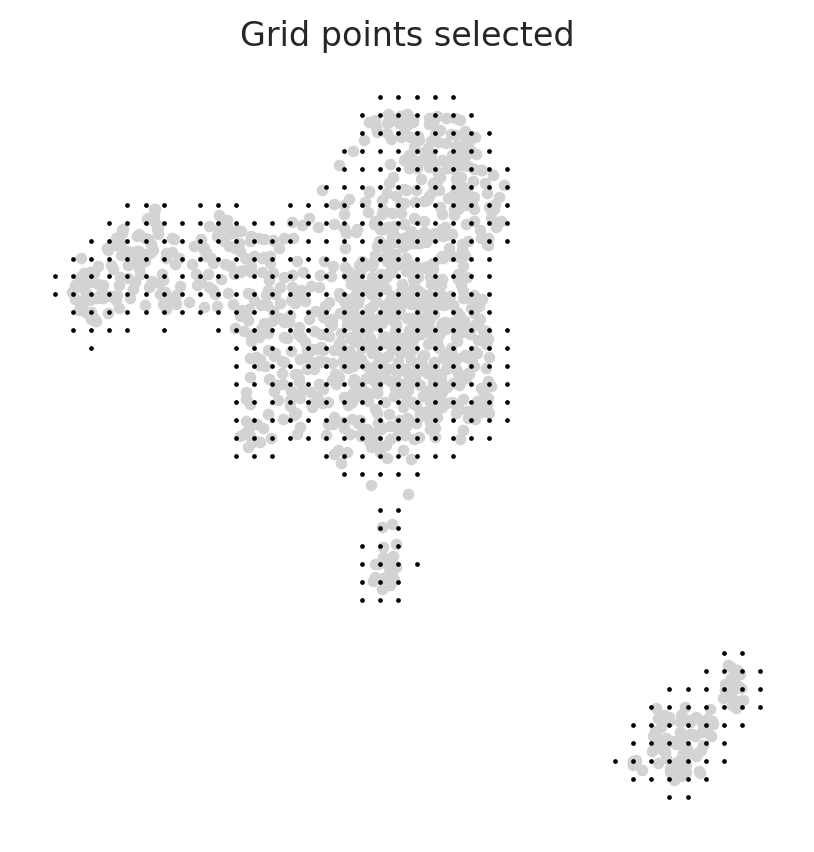

In [29]:
min_mass = 1.5
oracle.calculate_mass_filter(min_mass=min_mass, plot=True)

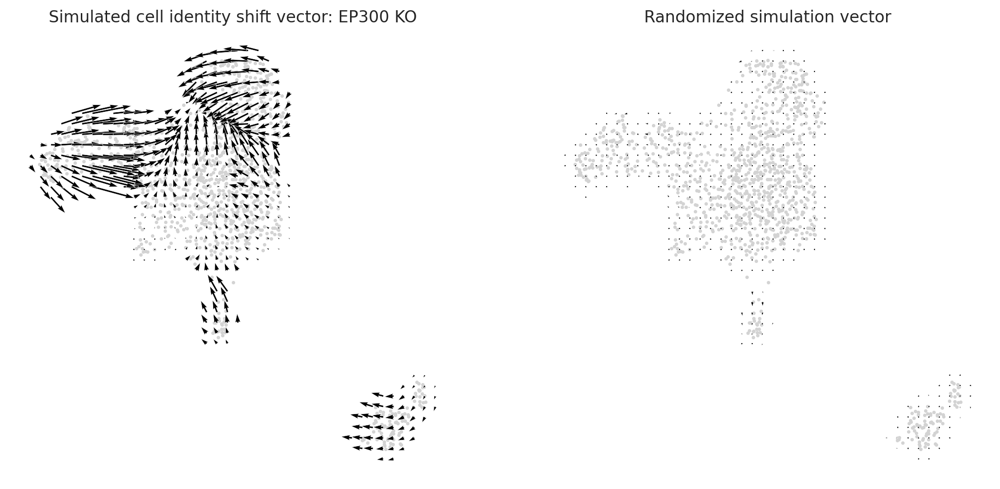

In [30]:
fig, ax = plt.subplots(1, 2,  figsize=[13, 6])

scale_simulation = 5
# Show quiver plot
oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {goi} KO")

# Show quiver plot that was calculated with randomized graph.
oracle.plot_simulation_flow_random_on_grid(scale=scale_simulation, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")

plt.show()

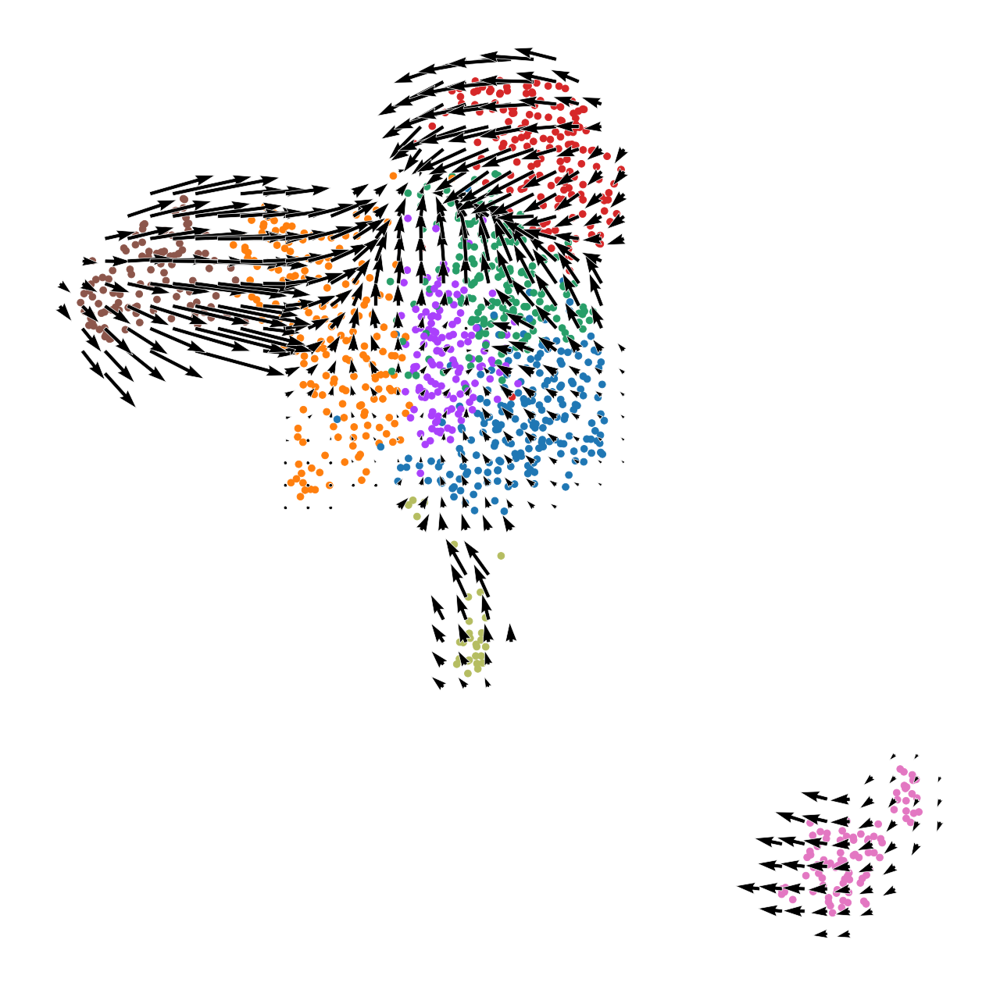

In [31]:
# Plot vector field with cell cluster
fig, ax = plt.subplots(figsize=[8, 8])

oracle.plot_cluster_whole(ax=ax, s=10)
oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax, show_background=False)

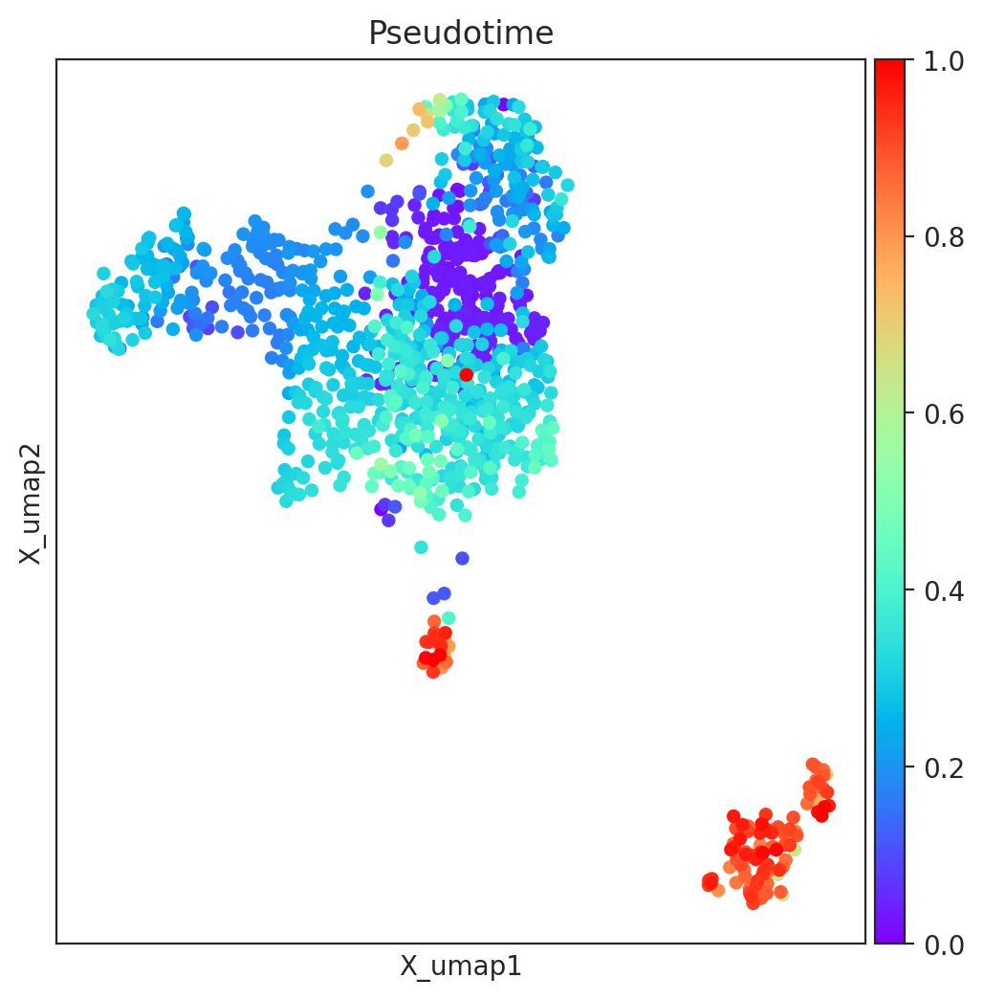

In [32]:
# Visualize pseudotime
fig, ax = plt.subplots(figsize=[6,6])

sc.pl.embedding(adata=oracle.adata, basis=oracle.embedding_name, ax=ax, cmap="rainbow",
                color=["Pseudotime"])

In [33]:
from celloracle.applications import Gradient_calculator

# Instantiate Gradient calculator object
gradient = Gradient_calculator(oracle_object=oracle, pseudotime_key="Pseudotime")

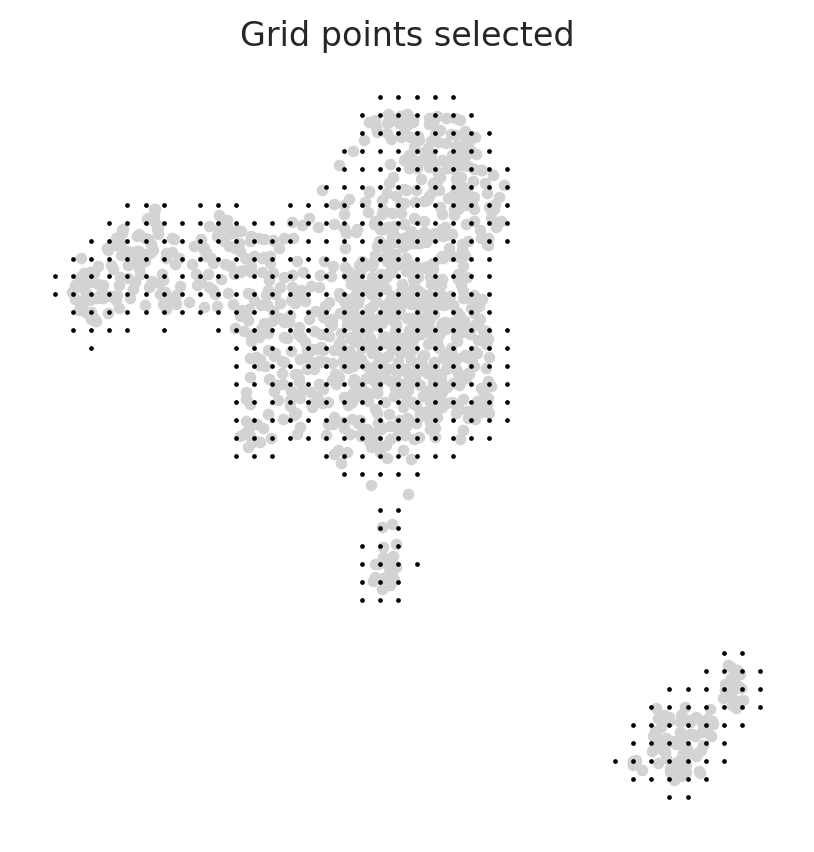

In [34]:
gradient.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)
gradient.calculate_mass_filter(min_mass=min_mass, plot=True)

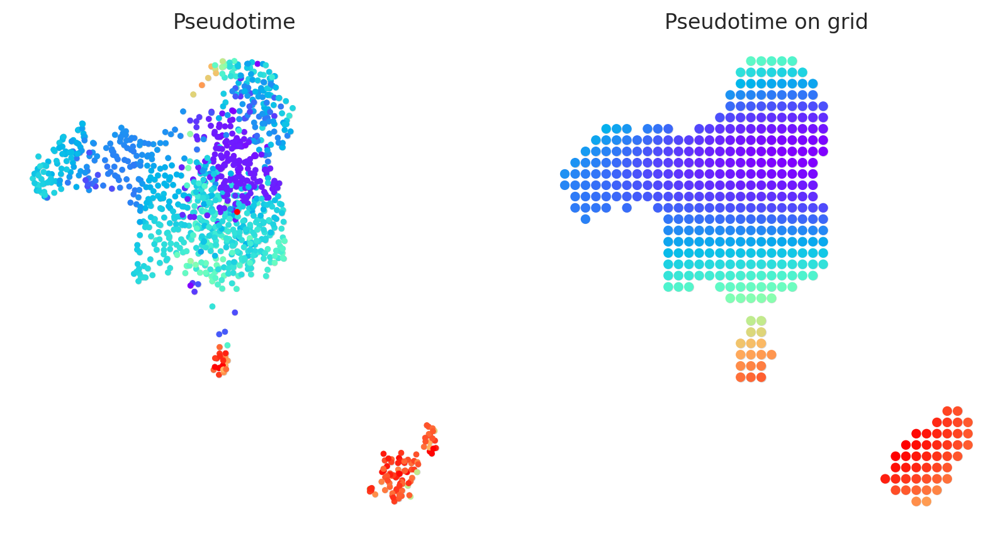

In [35]:
gradient.transfer_data_into_grid(args={"method": "polynomial", "n_poly":3}, plot=True)

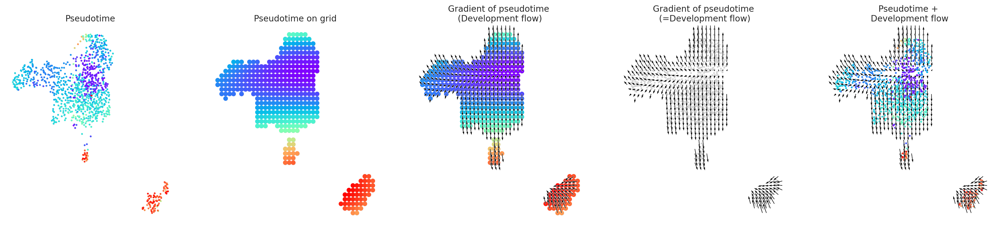

In [37]:
# Calculate graddient
gradient.calculate_gradient()

# Show results
scale_dev = 20
gradient.visualize_results(scale=scale_dev, s=5)

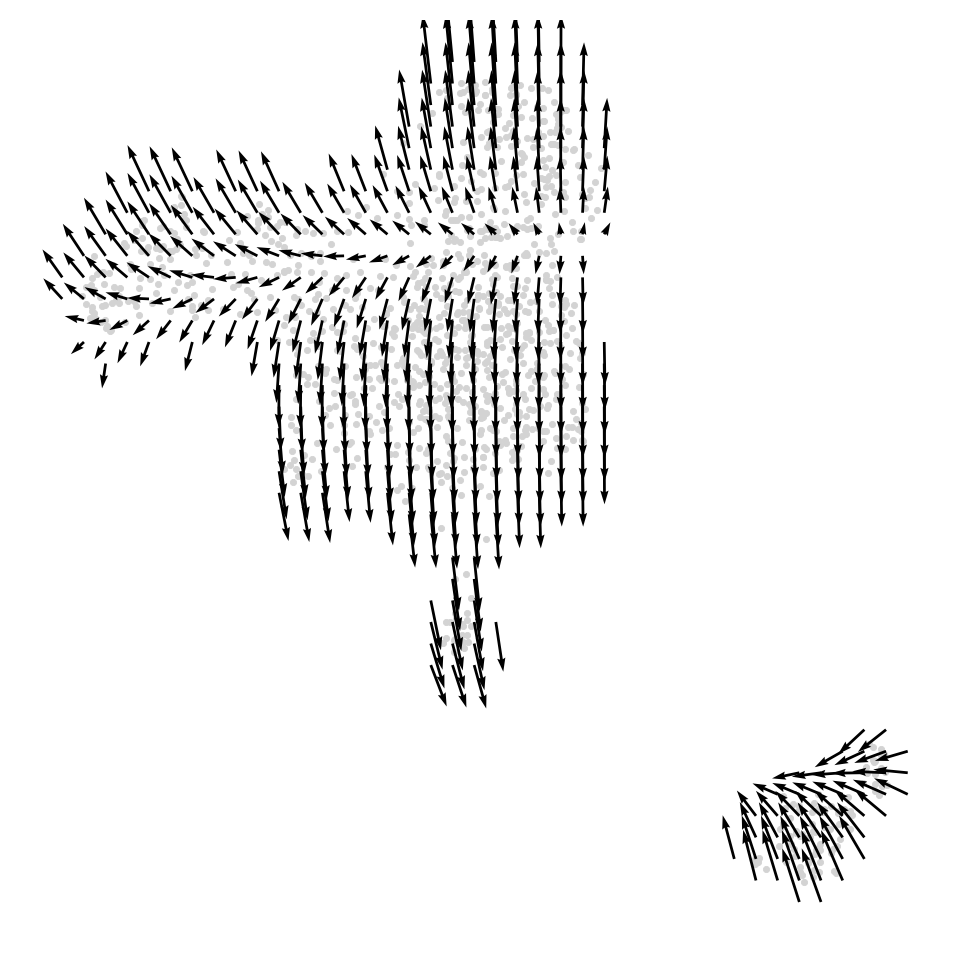

In [38]:
# Visualize results
fig, ax = plt.subplots(figsize=[6, 6])
gradient.plot_dev_flow_on_grid(scale=scale_dev, ax=ax)

In [39]:
from celloracle.applications import Oracle_development_module

# Make Oracle_development_module to compare two vector field
dev = Oracle_development_module()

# Load development flow
dev.load_differentiation_reference_data(gradient_object=gradient)

# Load simulation result
dev.load_perturb_simulation_data(oracle_object=oracle)


# Calculate inner produc scores
dev.calculate_inner_product()
dev.calculate_digitized_ip(n_bins=10)

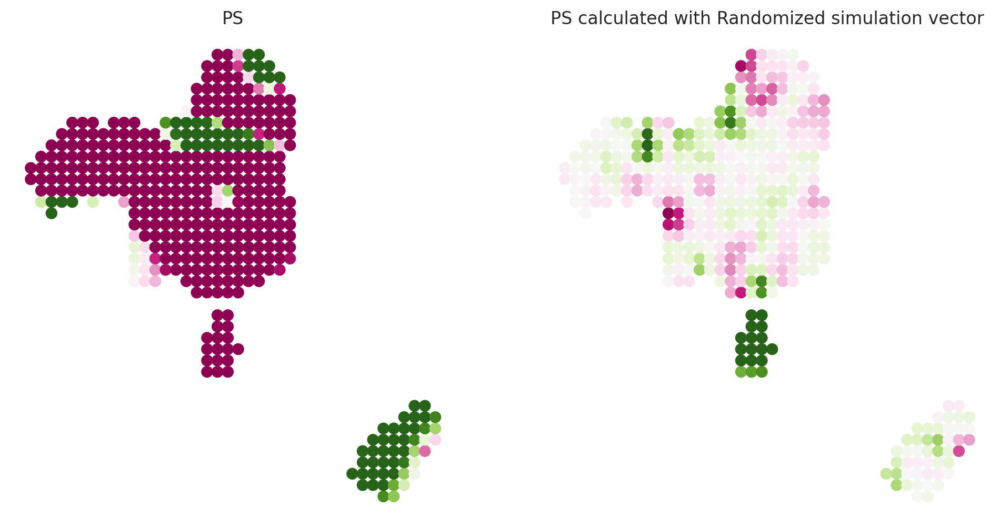

In [40]:
# Show perturbation scores
vm = 0.02

fig, ax = plt.subplots(1, 2, figsize=[12, 6])
dev.plot_inner_product_on_grid(vm=0.02, s=50, ax=ax[0])
ax[0].set_title(f"PS")

dev.plot_inner_product_random_on_grid(vm=vm, s=50, ax=ax[1])
ax[1].set_title(f"PS calculated with Randomized simulation vector")
plt.show()

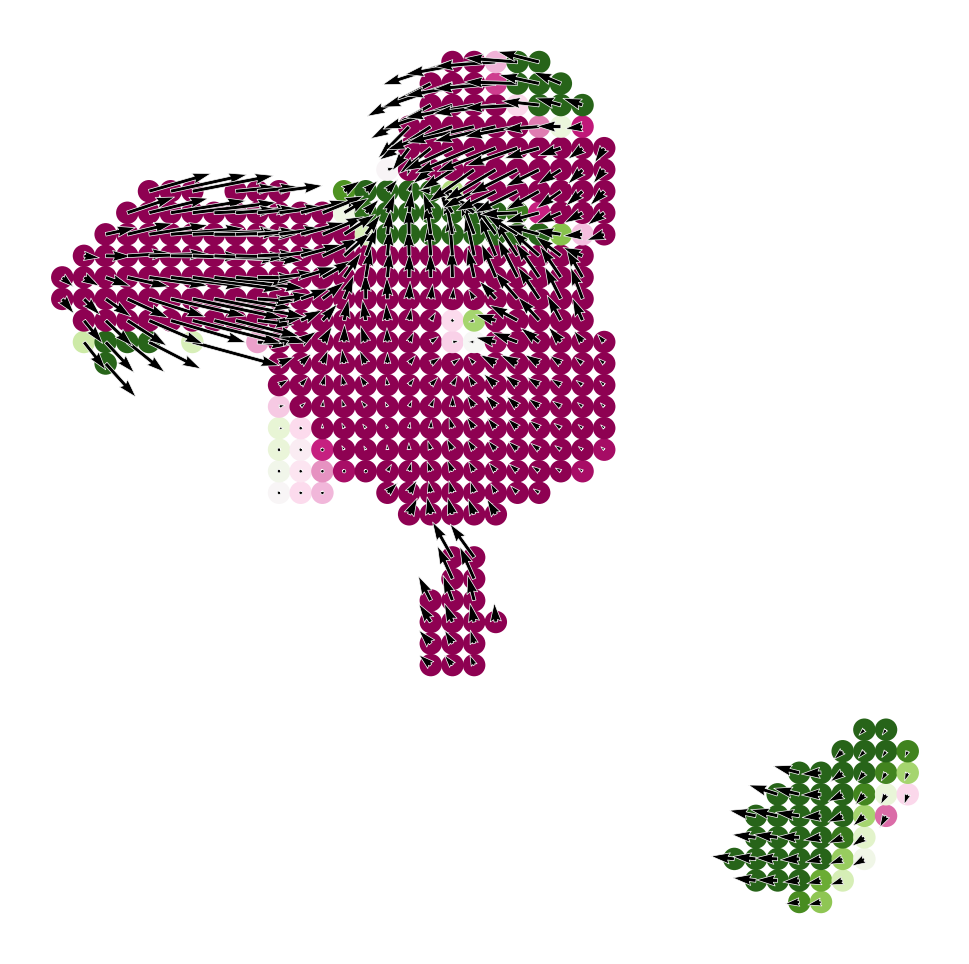

In [41]:
# Show perturbation scores with perturbation simulation vector field
fig, ax = plt.subplots(figsize=[6, 6])
dev.plot_inner_product_on_grid(vm=vm, s=50, ax=ax)
dev.plot_simulation_flow_on_grid(scale=scale_simulation, show_background=False, ax=ax)

2024-05-04 17:54:49,503 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2024-05-04 17:54:49,509 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


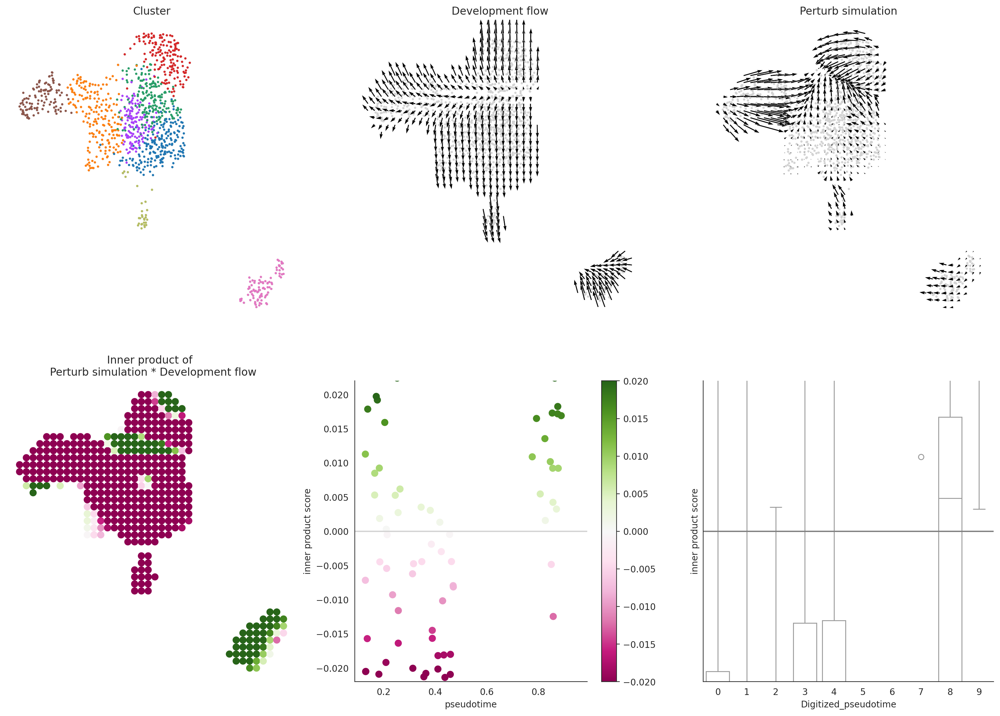

In [42]:
# Let's visualize the results
dev.visualize_development_module_layout_0(s=5,
                                          scale_for_simulation=scale_simulation,
                                          s_grid=50,
                                          scale_for_pseudotime=scale_dev,
                                          vm=vm)

In [43]:
# Focus on only the MEG lineage
# Get cell index list for the cells of interest
clusters = ['Megakaryocytes']
cell_idx = np.where(oracle.adata.obs["leiden"].isin(clusters))[0]

# Check index
print(cell_idx)

[  64   81   87  113  185  198  255  256  317  355  368  373  409  432
  457  601  623  628  640  670  727  755  759  804  863  866  949  973
 1071]


In [47]:
dev = Oracle_development_module()

# Load development flow
dev.load_differentiation_reference_data(gradient_object=gradient)

# Load simulation result
dev.load_perturb_simulation_data(oracle_object=oracle,
                                 cell_idx_use=cell_idx, # Enter cell id list
                                 name="Lineage_MEG",
                                  n_neighbors=10 # specified no of neighbours here since only 29 available
                                 )

# Calculation
dev.calculate_inner_product()
dev.calculate_digitized_ip(n_bins=10)

2024-05-04 18:13:04,790 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2024-05-04 18:13:04,793 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


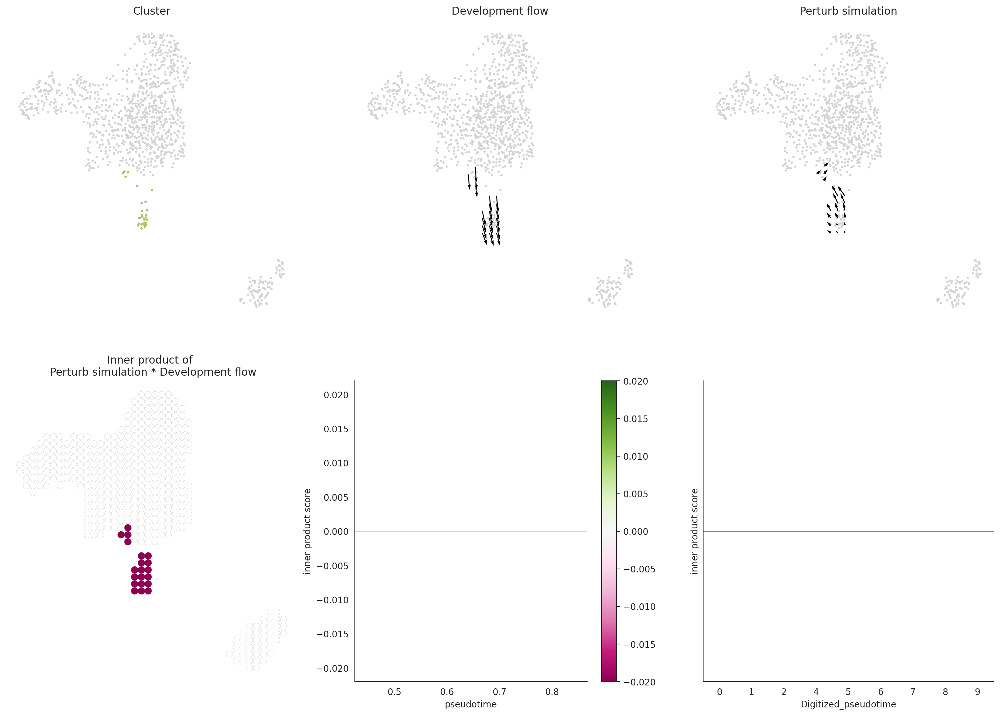

In [48]:
# Let's visualize the results
dev.visualize_development_module_layout_0(s=5,
                                          scale_for_simulation=scale_simulation,
                                          s_grid=50,
                                          scale_for_pseudotime=scale_dev,
                                          vm=vm)

In [49]:
from celloracle.visualizations.config import CONFIG
CONFIG["cmap_ps"] = "coolwarm"

2024-05-04 18:13:41,918 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2024-05-04 18:13:41,922 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


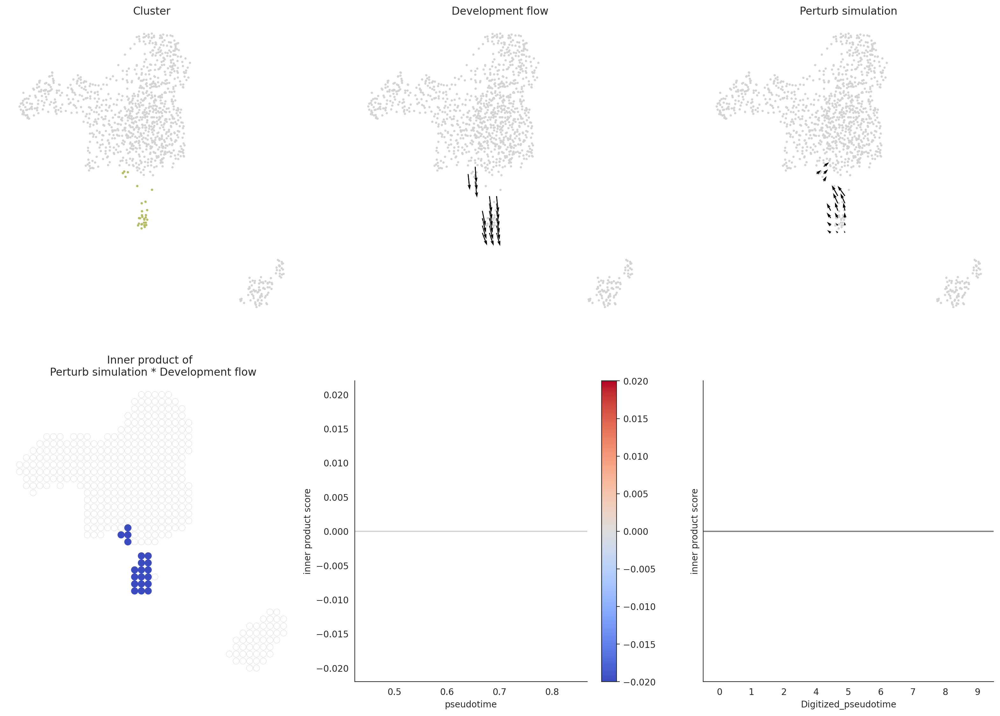

In [50]:
dev.visualize_development_module_layout_0(s=5,
                                          scale_for_simulation=scale_simulation,
                                          s_grid=50,
                                          scale_for_pseudotime=scale_dev,
                                          vm=vm)